<h2>2<sup>η</sup> ΕΡΓΑΣΤΗΡΙΑΚΗ ΑΣΚΗΣΗ</h2>
<h3>Ανάλυση Κοινωνικής Δομής σε Τεχνητές και Πραγματικές Σύνθετες Τοπολογίες Δικτύων</h3>
<p style=text-align:justify>Στην παρούσα άσκηση θα αναλυθούν τεχνητές και πραγματικές τοπολογίες σύνθετων δικτύων με βάση τις μετρικές που χρησιμοποιήθηκαν στην προηγούμενη άσκηση και κάποιες τεχνικές που έχουν ως στόχο την εύρεση κοινωνικής δομής. Συγκεκριμένα, θα χρησιμοποιηθούν και θα συγκριθούν διάφοροι αλγόριθμοι εντοπισμού κοινοτήτων σε γράφους δικτύων που προκύπτουν από πραγματικά δεδομένα καθώς και στους συνθετικούς γράφους της πρώτης εργαστηριακής άσκησης.</p>

Όνομα: Χατζής Ιωάννης Κωνσταντίνος

In [117]:
%matplotlib inline

import matplotlib
import networkx as nx
import random
import matplotlib.pyplot as plt
from tqdm import tqdm
import numpy as np
import pandas as pd
import scipy as sp
from sklearn.cluster import SpectralClustering


<h3>Α. Μελέτη πραγματικών τοπολογιών</h3>
<p style=text-align:justify>Στο παρόν ερώτημα θα μελετήσετε και θα αποκτήσετε αίσθηση της τοπολογικής δομής πραγματικών δικτύων. Πιο συγκεκριμένα, για τις τοπολογίες που φαίνονται στον <b>πίνακα 1</b>, να βρεθούν και να δειχθούν:</p>
<ol>
    <li>Η κατανομή του βαθμού κόμβου και ο μέσος βαθμός κάθε τοπολογίας.</li>
    <li>Η κατανομή του συντελεστή ομαδοποίησης κόμβου και ο μέσος συντελεστής ομαδοποίησης κάθε τοπολογίας.</li>
    <li>Η κατανομή της κεντρικότητας εγγύτητας και η μέση κεντρικότητα εγγύτητας κάθε τοπολογίας.</li>
</ol>
<p style=text-align:justify>Να συγκριθούν τα αποτελέσματα σε σχέση με αυτά των συνθετικών τοπολογιών. Να χαρακτηρίσετε τον τύπο κάθε μίας από τις πραγματικές τοπολογίες με βάση τους τύπους δικτύων που εξετάστηκαν στην πρώτη εργαστηριακή άσκηση.</p>

<table style=width:100%>
    <caption>Πίνακας <b>1</b>: Πραγματικές τοπολογίες</a></caption>
<tr>
    <th style=text-align:left>Τοπολογία</th>
    <th style=text-align:left>Αρχείο</th>
    <th style=text-align:left>Περιγραφή</th>
</tr>
<tr>
    <td style=text-align:left>American College Football</td>
    <td style=text-align:left><a style=text-decoration:none href='http://www-personal.umich.edu/~mejn/netdata/football.zip'>football.gml</a></td>
    <td style=text-align:left><p style=text-align:justify> The file <b>football.gml</b> contains the network of American football games between Division IA colleges during regular season Fall 2000, as compiled by M. Girvan and M. Newman. The nodes have values that indicate to which conferences they belong.</p>
    </td>
</tr>  
<tr>
    <td style=text-align:left>Game of Thrones - season 5</td>
    <td style=text-align:left><a style=text-decoration:none href='https://networkofthrones.wordpress.com/the-series/season-5/'>GoT</a></td>
    <td style=text-align:left><p style=text-align:justify> The season 5 <b>GoT</b> network represents the interactions between the characters of Game of Thrones in season 5. The season 5 network has 118 nodes (characters) and 394 weighted edges, corresponding to 5,139 interactions. Data can be found here: <a style=text-decoration:none href='https://raw.githubusercontent.com/mathbeveridge/gameofthrones/master/data/got-s5-edges.csv'>GoT_data</a></p>
</tr> 
<tr>
    <td style=text-align:left>email-Eu-core</td>
    <td style=text-align:left><a style=text-decoration:none href='https://snap.stanford.edu/data/email-Eu-core.html'>email-eu-core</a></td>
    <td style=text-align:left><p style=text-align:justify> The network <b>email-Eu-core</b> was generated using email data from a large European research institution. There is an edge (u, v) in the network if person u sent person v at least one email. The e-mails only represent communication between institution members (the core) and the dataset does not contain incoming messages from or outgoing messages to the rest of the world. The dataset also contains "ground-truth" community memberships of the nodes. Each individual belongs to exactly one of 42 departments at the research institute. </p>
</tr> 
    
</table>

<h4>Παραγωγή συνθετικών τοπολογιών</h4> 
<p>Προσοχή! Τα δίκτυα που θα παράξετε θα πρέπει να είναι συνδεδεμένα.</p>

In [87]:
n=80
d=4
M=300
R=0.25
p=0.3
k=4
g=0
seedno=5
random.seed(seedno)

'''
Define the basic functions that are derived from the previous lab
The 
The functions shown are:
---> find_degree(G) --- to compute each nodes degree and the mean degree of the graph

---> cc(G) --- compute clustering  coefficient of each node of the graph and the mean value

---> find_closeness(G) --- compute closeness value for each node and find the mean value for the graph G
'''

def analyze_graph(G):
    # Degree
    degrees = [degree for _, degree in nx.degree(G)]
    mean_degree = np.mean(degrees)

    # Clustering Coefficient
    cc_values = [nx.clustering(G, u) for u in G.nodes]
    cc_mean = np.mean(cc_values)

    # Closeness Centrality
    closeness_values = [nx.closeness_centrality(G, u) for u in G.nodes]
    closeness_mean = np.mean(closeness_values)

    return degrees, mean_degree, cc_values, cc_mean, closeness_values, closeness_mean



REG = nx.watts_strogatz_graph(n,d,g,seed=seedno)
RGER= nx.gnm_random_graph(n,M,seed=seedno)
RGG = nx.random_geometric_graph(n,R,seed=seedno)
SF = nx.barabasi_albert_graph(n,d,seed=seedno)
SW = nx.watts_strogatz_graph(n,d,p,seed=seedno)

Τυπικά δημιουργώ μια απεικόνιση για κάθε γράφο για να είναι πιο κατανοητή η δομή του μέσω visualization. 

In [88]:
graph_names = {
    'REG': ('Regular Graph', REG),
    'RGER': ('Random Graph Erdős–Rényi model', RGER),
    'RGG': ('Random Geometric Graph', RGG),
    'SF': ('Scale-Free', SF),
    'SW': ('Small-World', SW)
}

In [89]:
for i, graph in enumerate(graph_names):
    print(f"{graph_names[graph][0]} is Connected --> {nx.is_connected(graph_names[graph][1])}")

Regular Graph is Connected --> True
Random Graph Erdős–Rényi model is Connected --> True
Random Geometric Graph is Connected --> True
Scale-Free is Connected --> True
Small-World is Connected --> True


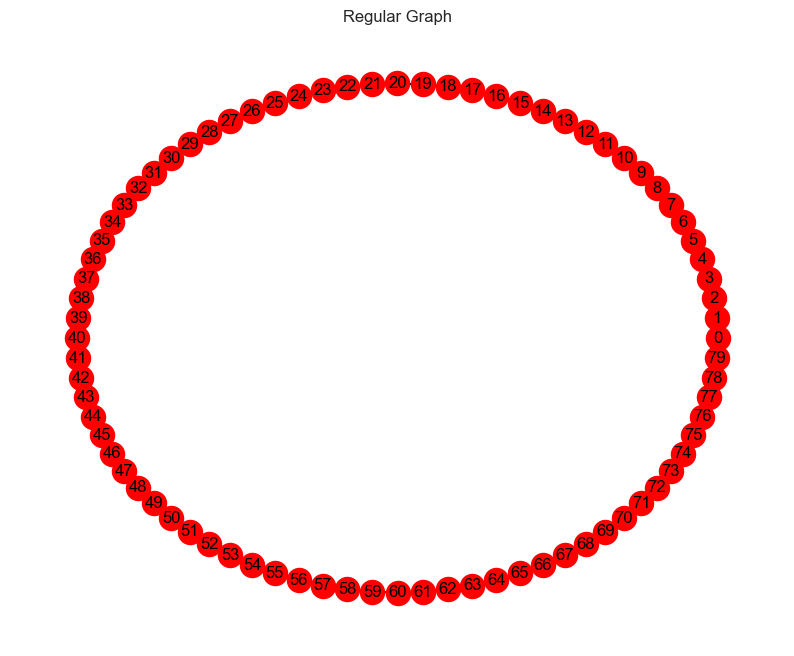

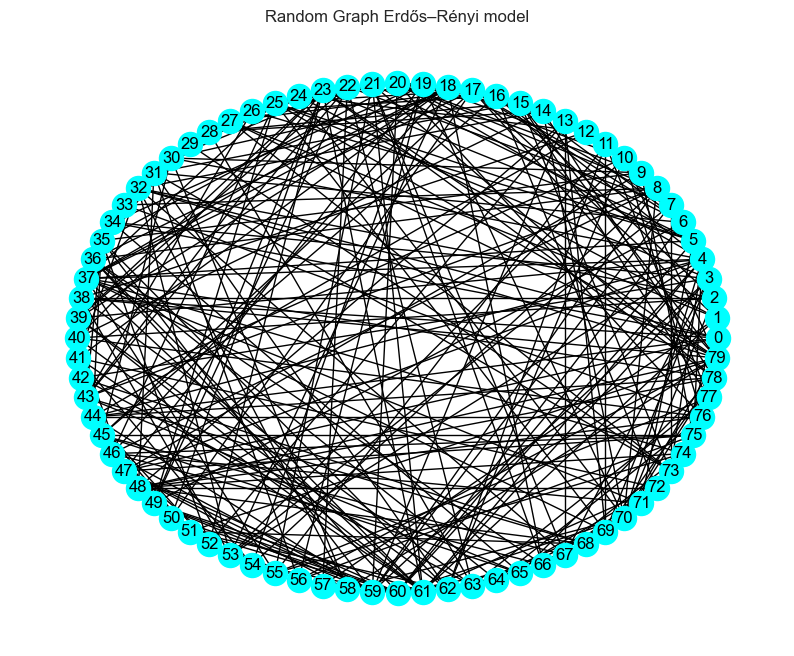

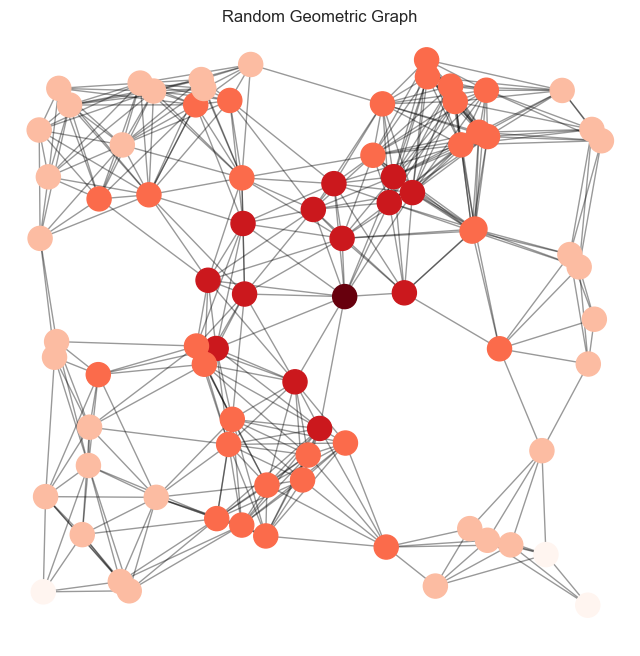

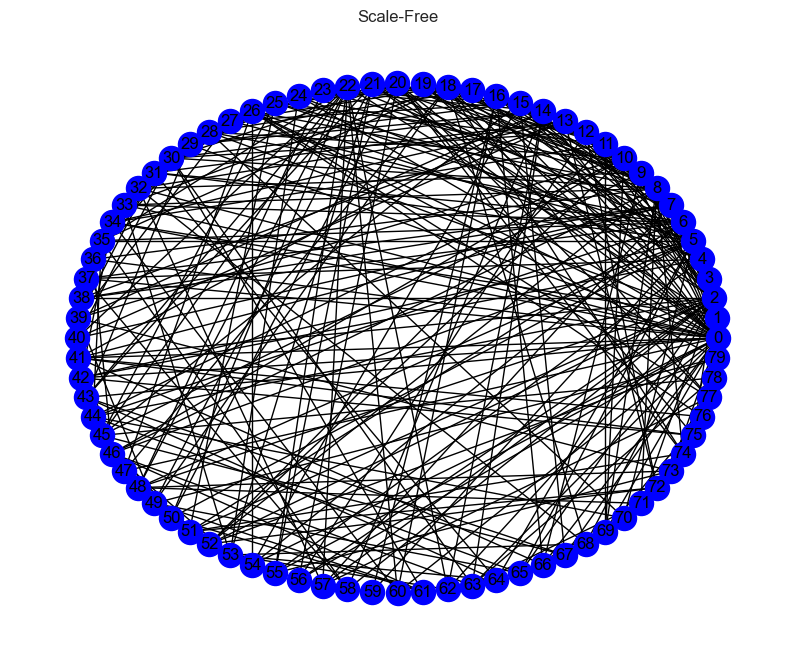

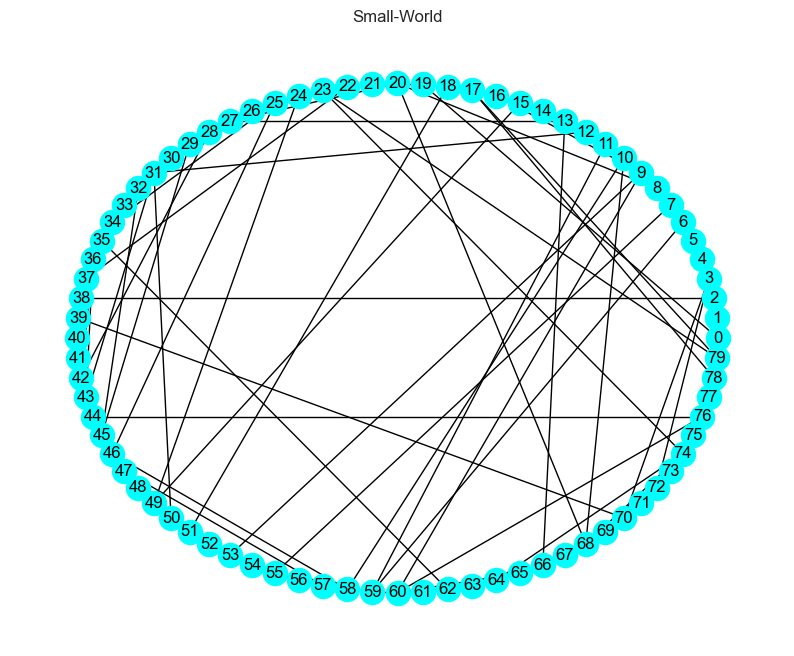

In [90]:
# Regular graph 
plt.figure(figsize=(10,8))
plt.title(graph_names['REG'][0])
visual_REG = nx.draw_circular(REG, node_size=300, node_color='red', with_labels=True)
plt.show()
# RGER
plt.figure(figsize=(10,8))
plt.title(graph_names['RGER'][0])
visual_RGER = nx.draw_circular(RGER, node_size=300, node_color='cyan', with_labels=True)
plt.show()

# RGG
pos = nx.get_node_attributes(RGG, "pos")
# find node near center (0.5,0.5) (central node)
dmin, ncenter = 1, 0
for i in pos:
    x, y = pos[i]
    d = (x - 0.5) ** 2 + (y - 0.5) ** 2
    if d < dmin:
        ncenter = i
        dmin = d
p = dict(nx.single_source_shortest_path_length(RGG, ncenter))

#plot the graph
plt.figure(figsize=(8, 8))
plt.title(graph_names['RGG'][0])
nx.draw_networkx_edges(RGG, pos, nodelist=[ncenter], alpha=0.4)
nx.draw_networkx_nodes(RGG, pos, nodelist=list(p.keys()),
                       node_size=300,
                       node_color=list(p.values()),
                       cmap=plt.cm.Reds_r)
plt.xlim(-0.05, 1.05)
plt.ylim(-0.05, 1.05)
plt.axis('off')
plt.show()
# SF
plt.figure(figsize=(10,8))
plt.title(graph_names['SF'][0])
visual_SF = nx.draw_circular(SF, node_size=300, node_color='blue', with_labels=True)
plt.show()
# SW
plt.figure(figsize=(10,8))
plt.title(graph_names['SW'][0])
visual_SW = nx.draw_circular(SW, node_size=300, node_color='cyan', with_labels=True)
plt.show()


Τυπώνω για κάθε τοπολογία τα χαρακτηριστικά από την ανάλυση


In [91]:
for i, graph in enumerate(graph_names):
    G = graph_names[graph][1]
    analysis = analyze_graph(G)
    G_name = graph_names[graph][0]
    print(f"{G_name}:\n\nDegree Values are:\t{analysis[0]}"
          f"\n\nMean Degree value:\t{analysis[1]}\n",
          "---------------------------------"*2,
          f"\n\nClustering Coefficient of values:\t{analysis[2]}"
          f"\n\nClustering Coefficient mean:\t{analysis[3]}\n",
          "---------------------------------"*2,
          f"\n\nCloseness values:\t{analysis[4]}"
          f"\n\nCloseness mean:\t{analysis[5]}\n",
          "---------------------------------\n"*2)

Regular Graph:

Degree Values are:	[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]

Mean Degree value:	4.0
 ------------------------------------------------------------------ 

Clustering Coefficient of values:	[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]

Clustering Coefficient mean:	0.5
 ------------------------------------------------------------------ 

Closeness values:	[0.09634146341463415, 0.09634146341463415, 0.09634146341463415, 0.0963414

In [92]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_graph_analysis_histograms(graph_names, deg=None, cc=None, cl=None, all_p=False):
    colors = ['#1f77b4', '#2ca02c', '#ff7f0e', '#d62728', '#9467bd']
    num_graphs = len(graph_names)

    # Set flags based on 'all' parameter
    if all_p:
        deg, cc, cl = True, True, True

    # Count the number of True parameters to determine the number of columns
    params = [deg, cc, cl]
    num_cols = sum(param is True for param in params)

    if num_cols == 0:
        raise ValueError("At least one of 'deg', 'cc', 'cl' must be True, or 'all' must be True.")

    fig, axes = plt.subplots(num_graphs, num_cols, figsize=(5 * num_cols, 5 * num_graphs), squeeze=False)

    for i, graph_key in enumerate(graph_names):
        G = graph_names[graph_key][1]
        G_name = graph_names[graph_key][0]
        analysis = analyze_graph(G)
        current_col = 0

        # Degree
        if deg:
            ax = axes[i][current_col]
            current_col += 1
            kde_d = len(set(analysis[0])) != 1
            color = colors[i % len(colors)]
            hist_deg = sns.histplot(analysis[0], bins=len(analysis[0]), kde=kde_d, color=color, ax=ax)
            # for patch in hist_deg.patches:
            #    ax.plot(patch.get_x() + patch.get_width() / 2, patch.get_height(),'o', markersize=2, color=color)
            ax.set_title(f"{G_name}\nDegree Distribution")
            ax.set_ylabel("Number of Nodes")
            ax.set_xlabel("Degree")

        # Clustering Coefficient
        if cc:
            ax = axes[i][current_col]
            current_col += 1
            kde_cc = len(set(analysis[2])) != 1
            color = colors[i % len(colors)]
            hist_cc = sns.histplot(analysis[2], bins=len(analysis[2]), kde=kde_cc, color=color, ax=ax)
            # for patch in hist_cc.patches:
            #     ax.plot(patch.get_x() + patch.get_width() / 2, patch.get_height(), 'o', markersize=2, color=color)
            ax.set_title(f"{G_name}\nClustering Coefficient")
            ax.set_ylabel("Number of Nodes")
            ax.set_xlabel("Clustering Coefficient")

        # Closeness Centrality
        if cl:
            ax = axes[i][current_col]
            kde_cl = len(set(analysis[4])) != 1
            color = colors[i % len(colors)]
            hist_cl = sns.histplot(analysis[4], bins=len(analysis[4]), kde=kde_cl, color=color, ax=ax)
            # for patch in hist_cl.patches:
            #     ax.plot(patch.get_x() + patch.get_width() / 2, patch.get_height(), 'o', markersize=2, color=color)
            ax.set_title(f"{G_name}\nCloseness Centrality")
            ax.set_ylabel("Number of Nodes")
            ax.set_xlabel("Closeness Centrality")

    plt.tight_layout()
    plt.show()

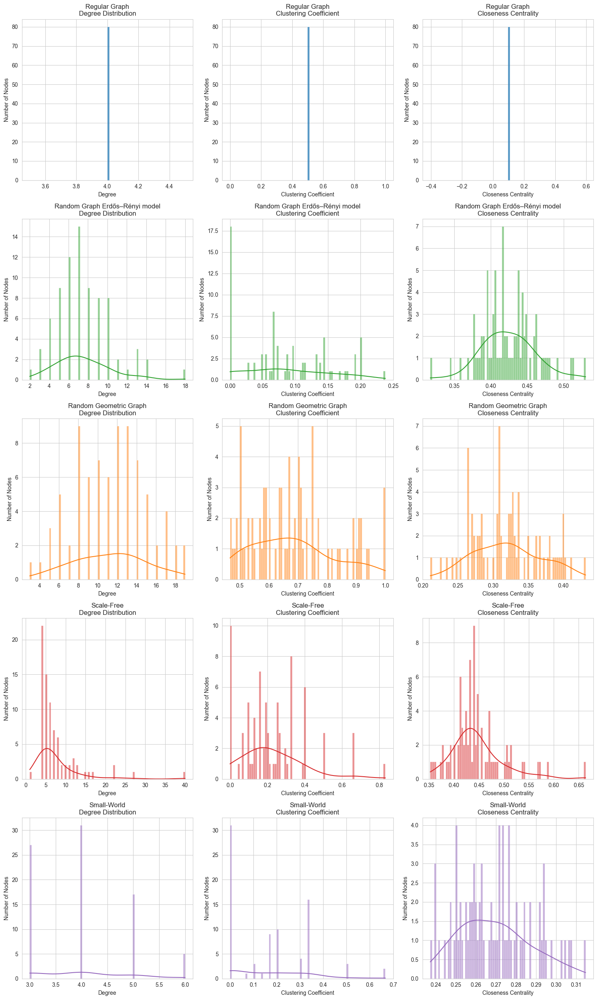

In [93]:
plot_graph_analysis_histograms(graph_names, all_p=True)

In [94]:
import matplotlib.pyplot as plt
import numpy as np

def plot_graph_mean_values(graph_names, deg=None, cc=None, cl=None, all_p=False):
    colors = ['#1f77b4', '#2ca02c', '#ff7f0e', '#d62728', '#9467bd']
    num_graphs = len(graph_names)

    # Set flags based on 'all' parameter
    if all_p:
        deg, cc, cl = True, True, True

    # Count the number of True parameters to determine the number of columns
    params = [deg, cc, cl]
    num_cols = sum(param is True for param in params)

    if num_cols == 0:
        raise ValueError("At least one of 'deg', 'cc', 'cl' must be True, or 'all' must be True.")

    fig, axes = plt.subplots(1, num_cols, figsize=(5 * num_cols, 5), squeeze=False)

    # Accumulate mean values for each metric
    deg_means, cc_means, cl_means = [], [], []
    graph_keys = list(graph_names.keys())

    for graph_key in graph_names:
        G = graph_names[graph_key][1]
        analysis = analyze_graph(G)

        if deg:
            deg_means.append(analysis[1])
        if cc:
            cc_means.append(analysis[3])
        if cl:
            cl_means.append(analysis[5])

    x = np.arange(len(graph_keys))  # the label locations
    width = 0.25  # the width of the bars

    current_col = 0

    # Degree
    if deg:
        ax = axes[0][current_col]
        current_col += 1
        ax.bar(x - width, deg_means, width, label='Degree', color=colors[0])
        ax.set_title("Mean Degree")
        ax.set_ylabel("Mean Value")
        ax.set_xticks(x)
        ax.set_xticklabels(graph_keys)
        ax.set_xlabel("Graph Name")
        
    # Clustering Coefficient
    if cc:
        ax = axes[0][current_col]
        current_col += 1
        ax.bar(x, cc_means, width, label='Clustering Coefficient', color=colors[1])
        ax.set_title("Mean Clustering Coefficient")
        ax.set_ylabel("Mean Value")
        ax.set_xticks(x)
        ax.set_xticklabels(graph_keys)
        ax.set_xlabel("Graph Name")
       
    # Closeness Centrality
    if cl:
        ax = axes[0][current_col]
        ax.bar(x + width, cl_means, width, label='Closeness Centrality', color=colors[2])
        ax.set_title("Mean Closeness Centrality")
        ax.set_ylabel("Mean Value")
        ax.set_xticks(x)
        ax.set_xticklabels(graph_keys)
        ax.set_xlabel("Graph Name")
        
    plt.tight_layout()
    plt.show()



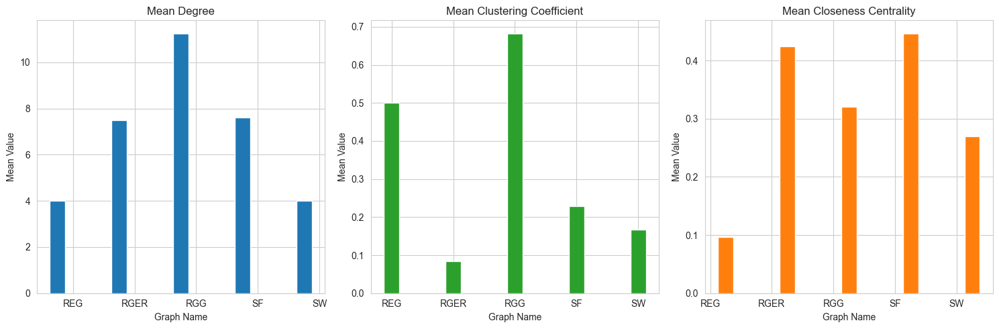

In [95]:
plot_graph_mean_values(graph_names, all_p=True)

<h4>Εισαγωγή και οπτικοποίηση πραγματικών τοπολογιών.</h4>

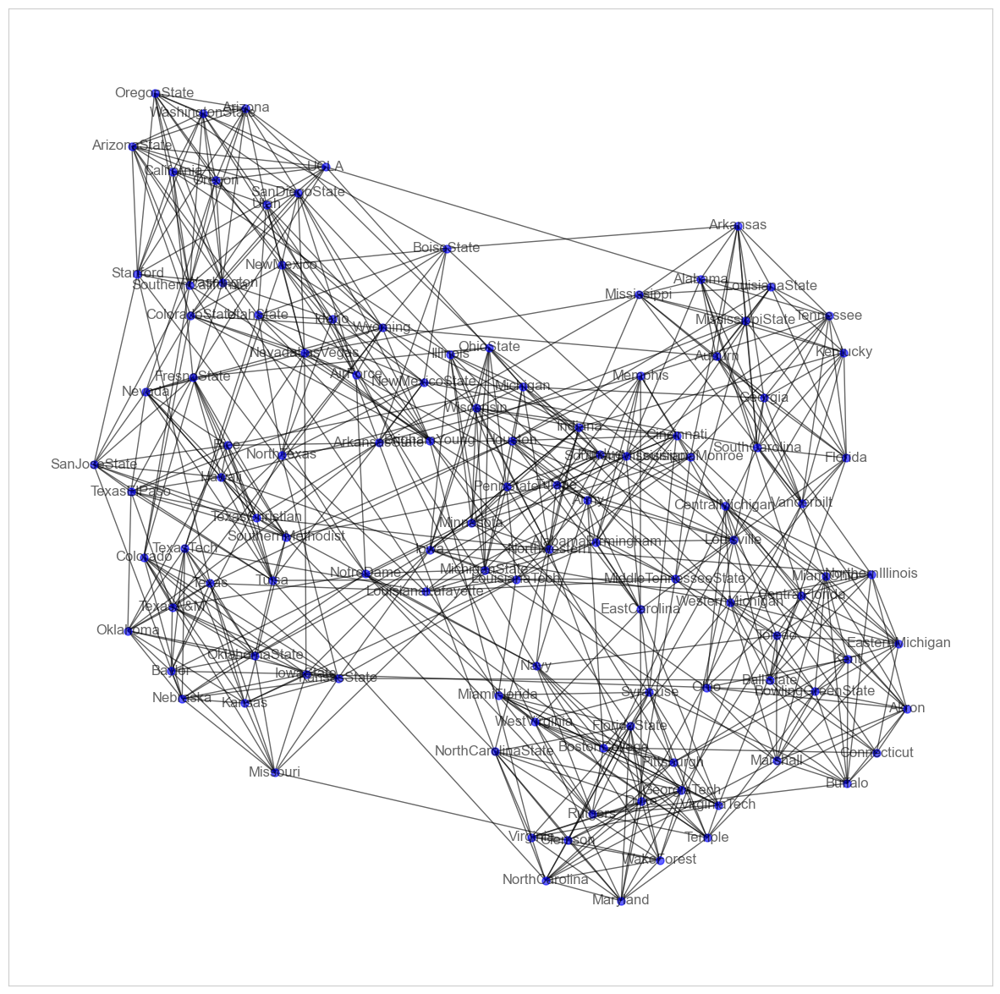

In [96]:
#football network
football=nx.read_gml(r"/home/opc/sna2/football.gml")

plt.figure(figsize = (15, 15))
plt.grid(False)
nx.draw_networkx(football, node_size = 42, node_color = 'blue', edge_color = 'black', alpha = 0.6)

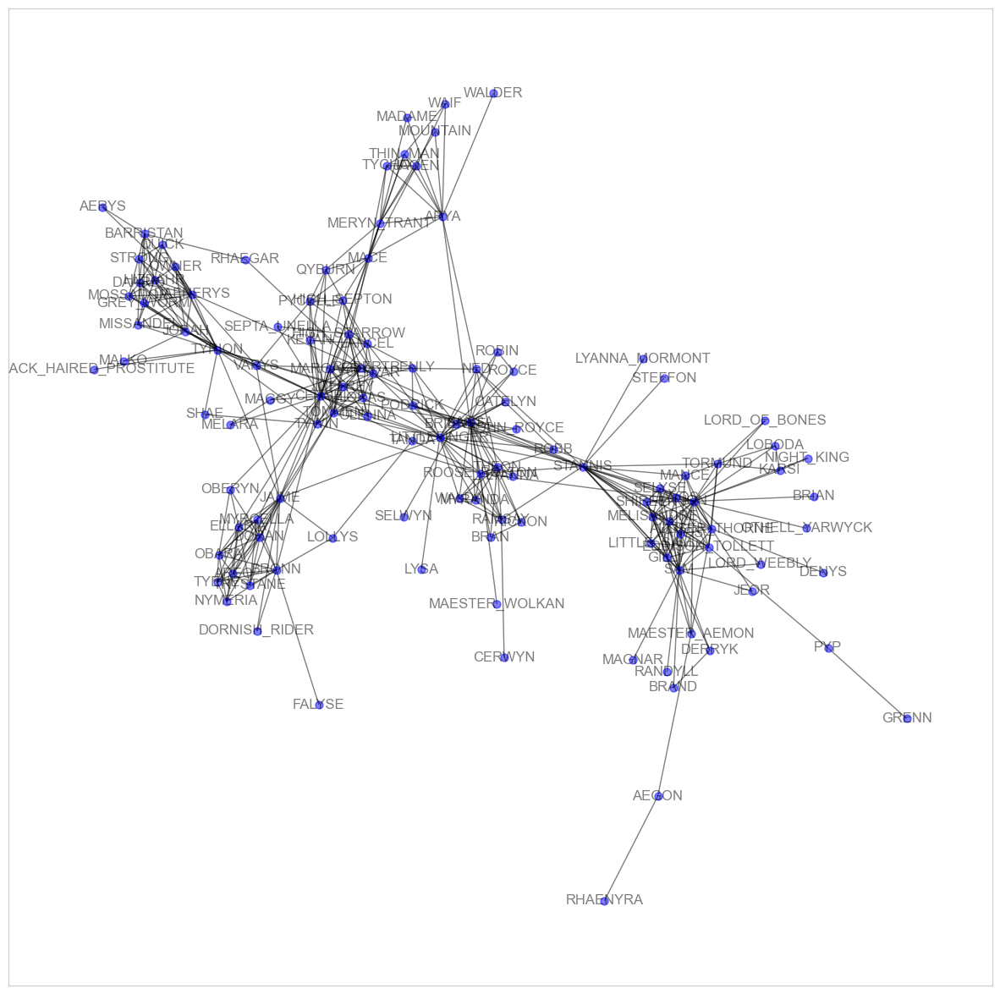

In [97]:
#Game of thrones network
import csv
got=nx.Graph()
with open('/home/opc/sna2/got_s5.csv') as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=',')
    line_count = 0
    next(csv_reader)
    for row in csv_reader:
        got.add_edge(row[0],row[1])
        line_count += 1
     
plt.figure(figsize = (15, 15))
plt.grid(False)   
nx.draw_networkx(got, node_size = 42, node_color = 'blue', edge_color = 'black', alpha = 0.5)

#### Προσοχή! Θα μελετήσετε τη μεγαλύτερη συνδεδεμένη συνιστώσα του δικτύου email-Eu-core, αφού πρώτα αφαιρέσετε τα self-loops. Μπορείτε να κάνετε χρήση των συναρτήσεων connected_components, subgraph, remove_edges_from του networkx.

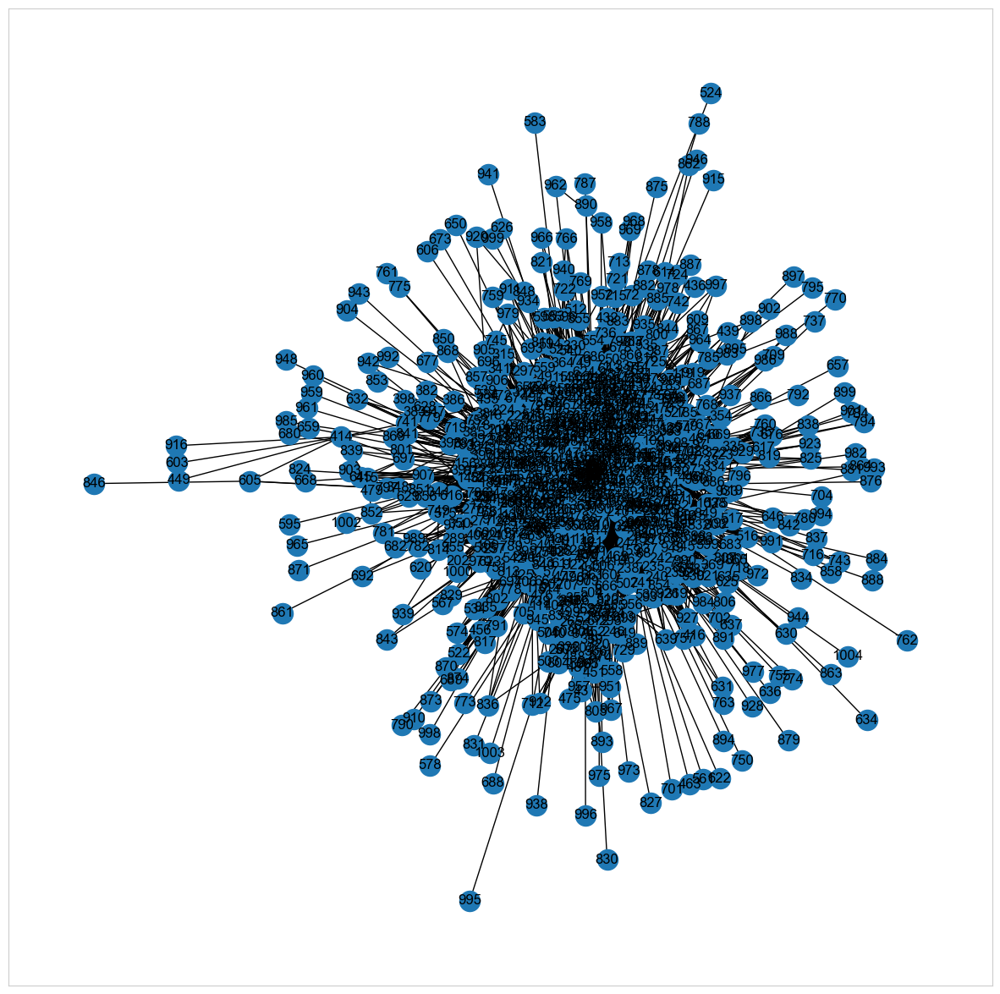

In [98]:
#email-Eu-core network
eu=nx.read_edgelist("/home/opc/sna2/email-Eu-core.txt",create_using=nx.Graph())
# remove self loops using remove_edges_from
eu.remove_edges_from(nx.selfloop_edges(eu))
# largest connected component
largest_eu = max(nx.connected_components(eu), key = len)
# eu subgraph
eu_subgraph = eu.subgraph(largest_eu)
# visualize
plt.figure(figsize = (15, 15))
plt.grid(False)
nx.draw_networkx(eu.subgraph(largest_eu))

Ορίζω το dictionary με τα graphs και τα ονόματα τους. Ελέγχο ότι όλοι οι γράφοι είναι connected. 

In [99]:
rg_names = {
    'football': ('Football Graph', football),
    'got': ('Game of Thrones S5 Graph', got),
    'eu': ('email-Eu-core graph', eu_subgraph)
}
for i, graph in enumerate(rg_names):
    print(f"{rg_names[graph][0]} is Connected --> {nx.is_connected(rg_names[graph][1])}")

Football Graph is Connected --> True
Game of Thrones S5 Graph is Connected --> True
email-Eu-core graph is Connected --> True


Αναλύω κάθε γράφο χρησιμοποιώντας την υλοποίηση την προηγούμενης συνάρτησης, τυπώνοντας τα κύρια χαρακτηριστικά τους και τη μέση τιμή για κάθε ένα από αυτά. 


In [100]:
f_analysis = analyze_graph(football)
got_analysis = analyze_graph(got)
eu_analysis = analyze_graph(eu_subgraph)

Ορίζω τις συναρτήσεις για να κάνω plot τα χαρακτηριστικά

<h4>Μελέτη βαθμού κόμβου για πραγματικές και συνθετικές τοπολογίες.</h4>

In [101]:
for i, graph in enumerate(rg_names):
    G = rg_names[graph][1]
    analysis = analyze_graph(G)
    G_name = rg_names[graph][0]
    print(f"{G_name}:\n\nDegree Values are:\t{analysis[0]}"
          f"\n\nMean Degree value:\t{analysis[1]}\n",
          "<--------------------------------->"*2,"\n",
          "<--------------------------------->"*2,"\n\n")
          
# plot_graph_analysis_histograms(rg_names,deg=True)

Football Graph:

Degree Values are:	[12, 12, 12, 12, 11, 12, 12, 12, 11, 11, 10, 10, 10, 11, 10, 12, 11, 11, 11, 11, 11, 11, 11, 11, 10, 11, 10, 11, 9, 11, 11, 11, 11, 10, 11, 11, 8, 11, 11, 11, 11, 10, 7, 11, 11, 11, 11, 11, 11, 11, 9, 11, 10, 12, 10, 11, 10, 10, 10, 8, 11, 11, 11, 9, 11, 11, 11, 12, 11, 11, 11, 10, 11, 11, 11, 10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 9, 11, 11, 12, 11, 9, 11, 11, 10, 10, 10, 10, 8, 11, 10, 11, 10, 10, 10, 12, 10, 11, 10, 10, 11, 11, 11, 10, 10, 11]

Mean Degree value:	10.660869565217391
 <---------------------------------><---------------------------------> 
 <---------------------------------><---------------------------------> 


Game of Thrones S5 Graph:

Degree Values are:	[11, 6, 11, 19, 12, 17, 7, 14, 30, 11, 8, 6, 25, 24, 25, 21, 20, 12, 10, 8, 12, 10, 10, 9, 8, 8, 6, 8, 10, 11, 3, 7, 6, 10, 7, 7, 10, 10, 6, 11, 6, 9, 7, 6, 10, 7, 4, 9, 6, 6, 3, 7, 7, 5, 7, 7, 5, 1, 2, 10, 3, 9, 3, 2, 6, 6, 7, 2, 2, 10, 11, 2, 2, 3, 9, 3, 6, 5, 7, 5, 4, 4, 2, 3

In [102]:
# plot_graph_mean_values(rg_names, deg=True)

<h4>Μελέτη συντελεστή ομαδοποίησης για πραγματικές και συνθετικές τοπολογίες</h4>

In [103]:
for i, graph in enumerate(rg_names):
    G = rg_names[graph][1]
    analysis = analyze_graph(G)
    G_name = rg_names[graph][0]
    print(f"{G_name}:\n\nClustering Coefficient of values:\t{analysis[2]}"
          f"\n\nClustering Coefficient mean:\t{analysis[3]}\n",
          "<--------------------------------->"*2,"\n",
          "<--------------------------------->"*2,"\n\n")
# plot_graph_analysis_histograms(rg_names,cc=True)

Football Graph:

Clustering Coefficient of values:	[0.3484848484848485, 0.4393939393939394, 0.3787878787878788, 0.3333333333333333, 0.41818181818181815, 0.36363636363636365, 0.3181818181818182, 0.3939393939393939, 0.4727272727272727, 0.4727272727272727, 0.4444444444444444, 0.3111111111111111, 0.3333333333333333, 0.38181818181818183, 0.37777777777777777, 0.3484848484848485, 0.41818181818181815, 0.34545454545454546, 0.4, 0.43636363636363634, 0.36363636363636365, 0.45454545454545453, 0.509090909090909, 0.45454545454545453, 0.2222222222222222, 0.509090909090909, 0.3333333333333333, 0.36363636363636365, 0.3333333333333333, 0.4909090909090909, 0.4727272727272727, 0.38181818181818183, 0.38181818181818183, 0.6444444444444445, 0.38181818181818183, 0.43636363636363634, 0.14285714285714285, 0.5272727272727272, 0.3090909090909091, 0.41818181818181815, 0.34545454545454546, 0.5333333333333333, 0.14285714285714285, 0.2909090909090909, 0.36363636363636365, 0.5272727272727272, 0.5272727272727272, 0.381

In [104]:
# plot_graph_mean_values(rg_names, cc=True)

<h4>Μελέτη κεντρικότητας εγγύτητας για πραγματικές και συνθετικές τοπολογίες </h4>

In [105]:
for i, graph in enumerate(rg_names):
    G = rg_names[graph][1]
    analysis = analyze_graph(G)
    G_name = rg_names[graph][0]
    print(f"\n\nCloseness values:\t{analysis[4]}"
          f"\n\nCloseness mean:\t{analysis[5]}\n",
          "<--------------------------------->"*2,"\n",
          "<--------------------------------->"*2,"\n\n")
# plot_graph_analysis_histograms(rg_names,cl=True)



Closeness values:	[0.42379182156133827, 0.41304347826086957, 0.40714285714285714, 0.42066420664206644, 0.4028268551236749, 0.3838383838383838, 0.4253731343283582, 0.4014084507042254, 0.36075949367088606, 0.397212543554007, 0.38127090301003347, 0.4028268551236749, 0.3904109589041096, 0.42066420664206644, 0.38513513513513514, 0.42379182156133827, 0.42379182156133827, 0.41155234657039713, 0.38, 0.3904109589041096, 0.4028268551236749, 0.397212543554007, 0.36774193548387096, 0.38513513513513514, 0.42379182156133827, 0.41304347826086957, 0.3986013986013986, 0.3825503355704698, 0.40860215053763443, 0.4, 0.41007194244604317, 0.3787375415282392, 0.41007194244604317, 0.3877551020408163, 0.37623762376237624, 0.397212543554007, 0.4014084507042254, 0.3944636678200692, 0.40425531914893614, 0.40714285714285714, 0.3986013986013986, 0.3958333333333333, 0.37012987012987014, 0.3958333333333333, 0.4, 0.397212543554007, 0.3931034482758621, 0.40569395017793597, 0.41007194244604317, 0.40425531914893614, 0.

In [106]:

# plot_graph_mean_values(rg_names, cl=True)

Γραφήματα για την αναπαράσταση των τιμών των χαρακτηριστικών των γράφων, όπως και στην προηγούμενη άσκηση. Παρακάτω φαίνονται συγκεντρωμένες οι κατανομές των σχετικών χαρακτηριστικών για κάθε γράφο και η μέση τιμή τους.

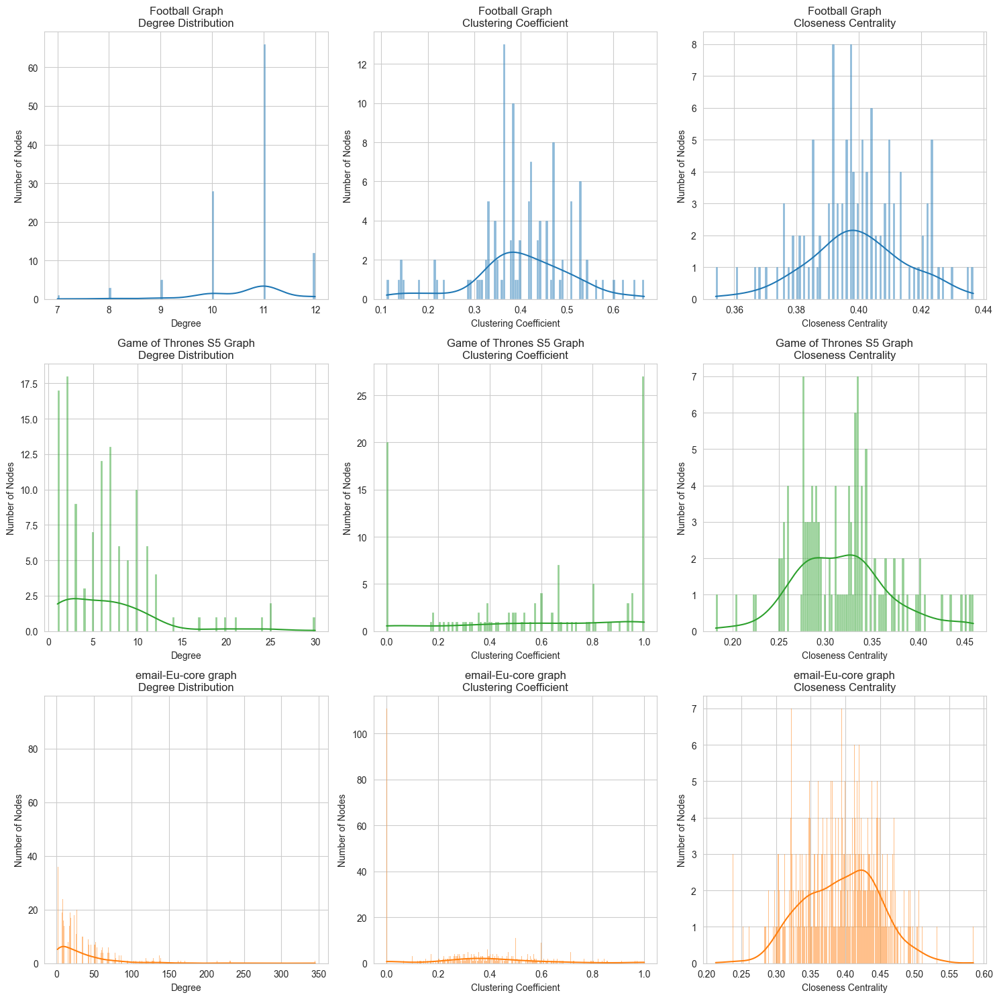

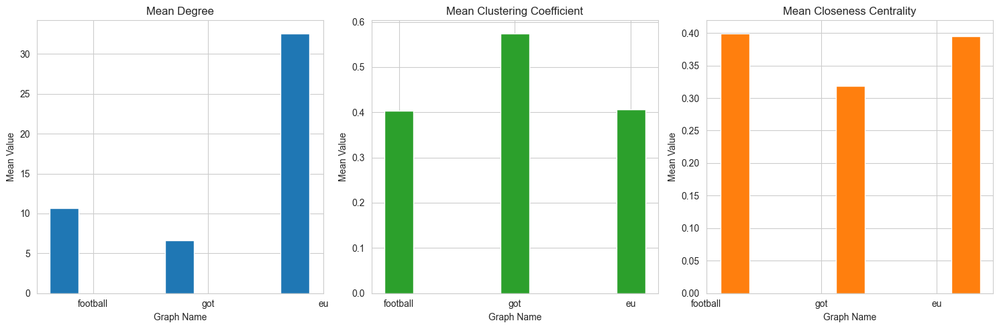

In [107]:
#plot the graph characteristics distribution
plot_graph_analysis_histograms(rg_names, all_p=True)
#plot the graph characteristics mean values
plot_graph_mean_values(rg_names, all_p=True)

**Σχόλια**:
> **Football Graph**: Όσον αφορά το δίκτυο αυτό, άξια σχολιασμού είναι τα διαγράμματα με τις κατανομές των τιμών των χαρακτηριστικών του, όπου βλέπουμε μεγάλη ομοιότητα με δίκτυο τύπου "RGER". Οι τιμές των κατανομών φαίνονται να είναι όμοιες τόσο στο "closeness" που τείνει σε κανονική κατανομή, στο "degree" που ομοιάζει σε κατανομή Poisson και στο "clustering coefficient" που ομοιάζει σε κανονική. 

> **GoT S5 Graph**: Όσον αφορά το τον "got s5" γράφο, άξιο σχολιασμού είναι ότι πρόκειται για *Random Geometric Graph*, προκύπτει από το visualization που έγινε προηγουμένως και από την άλλη το γεγονός ότι οι κατανομές των χαρακτηριστικών του έχουν μεγάλη ομοιότητα με τον "RGG" γράφο. Οι τιμές των κατανομών φαίνονται να ομοιάζουν εξίσου με τον RGG αφού έχουν μορφή ομοιόμορφης κατανομής. 

> **email-Eu-core graph**: Στην περίπτωση του δικτύου αυτού, η ομοιότητα είναι όσον αφορά τις μετρικές degree και closeness centrality που τείνουν σε αυτές του Scale-Free γράφου του προηγούμενου ερωτήματος. Τόσο στις κατανομές όσο και στο εύρος των τιμών, οι βαθμοί των κόμβων η ομοιότητα είναι εμφανής με τις κατανομές να είναι ομοιόμορφες. Όσον αφορά τώρα το clustering coefficient η ομοιότητα είναι με τον RGER γράφο, αφού οι τιμές του είναι κατανεμημένες σε κανονική κατανομή.

<h3>B. Εξοικείωση με τα εργαλεία εντοπισμού κοινοτήτων</h3>
<ol>
<li>Χρησιμοποιώντας τις συναρτήσεις του <b>πίνακα 2</b> για κάθε <u>πραγματικό</u> (<b>πίνακας 1</b>) και <u>συνθετικό</u> (από την <b>άσκηση 1</b>) δίκτυο:</p>
<ol>
    <li>να οπτικοποιηθούν οι κοινότητες που προκύπτουν από την κάθε μέθοδο,</li>
    <li>να γίνουν οι απαραίτητοι σχολιασμοί (π.χ: σύγκριση του αριθμού των κοινοτήτων που υπολογίζει ο κάθε αλγόριθμος).</li>
</ol>
<p>Για την οπτικοποίηση, να επισημανθεί διαφορετικά κάθε κοινότητα, π.χ. με διαφορετικό χρώμα.</p>
<p style=text-align:justify>Στην περίπτωση των συνθετικών δικτύων, να πραγματοποιηθούν συγκρίσεις και μεταξύ των διαφορετικών τύπων τοπολογιών. Για παράδειγμα, στην περίπτωση του τυχαίου γεωμετρικού γράφου, υπάρχει διαισθητικά μία κοινότητα γύρω από κάθε κόμβο που δημιουργείται με βάση τις αποστάσεις του τελευταίου από τους υπόλοιπους κόμβους του δικτύου. Στην περίπτωση των scale-free δικτύων, είναι πιθανό να σχηματίζονται κοινότητες γύρω από τους κόμβους με μεγάλο βαθμό.</p>
<li>Για κάθε αλγόριθμο εντοπισμού κοινοτήτων και για κάθε τοπολογία αξιολογήστε την ποιότητα της διαμέρισης με τις μετρικές performance και modularity (<a style=text-decoration:none href='https://networkx.org/documentation/stable/reference/algorithms/community.html#module-networkx.algorithms.community.quality'>measuring_partitions</a>). Για την μετρική performance, θα χρησιμοποιήσετε την συνάρτηση partition_quality του networkx.</li>
<li>Για την μεγαλύτερη συνδεδεμένη συνιστώσα του email-Eu-core, να συγκρίνετε την ground-truth διαμέριση που δίνεται στο αρχείο Email-Eu-core-department-labels.txt με τις διαμερίσεις που προκύπτουν από τις εξεταζόμενες μεθόδους ως προς το πλήθος των παραγόμενων κοινοτήτων και ως προς τις μετρικές performance και modularity. </li>
<li>Για την παρακολούθηση του χρόνου εκτέλεσης της υλοποίησής σας, μπορείτε να χρησιμοποιήσετε την βιβλιοθήκη <a style=text-decoration:none href='https://tqdm.github.io/'>tqdm</a>. Στο σχολιασμό σας να λάβετε υπόψη το trade-off της ποιότητας της διαμέρισης και του χρόνου εκτέλεσης των εξεταζόμενων αλγορίθμων. </li>
</ol>

<table style=float:left;width:70%>
    <caption>Πίνακας <b>2</b>: Συναρτήσεις εντοπισμού κοινοτήτων</caption>
    <tr>
        <th style=text-align:left> Μέθοδος εντοπισμού κοινοτήτων</th>
        <th style=text-align:left>Συνάρτηση</th>
    </tr>
    <tr>
        <td style=text-align:left>Spectral Clustering</td>
        <td style=text-align:left><a style=text-decoration:none href='http://scikit-learn.org/stable/modules/generated/sklearn.cluster.SpectralClustering.html'>SpectralClustering</a></td>
    </tr>
       <tr>
        <td style=text-align:left>Newman-Girvan</td>
        <td style=text-align:left><a style=text-decoration:none                               href='https://networkx.github.io/documentation/latest/reference/algorithms/generated/networkx.algorithms.community.centrality.girvan_newman.html'>girvan_newman</a></td>
    </tr>
    <tr>
        <td style=text-align:left>Modularity Maximization</td>
        <td style=text-align:left><a style=text-decoration:none                               href='https://networkx.github.io/documentation/latest/reference/algorithms/generated/networkx.algorithms.community.modularity_max.greedy_modularity_communities.html'>greedy_modularity_communities</a></td>
    </tr>
</table>
    

<p style=text-align:justify>Προτού εφαρμόσετε τις συναρτήσεις εντοπισμού κοινοτήτων μελετήστε προσεκτικά την <b>είσοδο που απαιτούν καθώς και τη μορφή εξόδου που παράγουν.</b></p>

In [108]:
#Χρησιμοποιήστε την συνάρτηση conv2int για να μετατρέψετε τα labels των κόμβων στις πραγματικές τοπολογίες σε integers
def conv2int(G,start_value):
    nG = nx.convert_node_labels_to_integers(G,first_label=start_value)
    G_mapping=dict(enumerate(G.nodes,0))
    return nG,G_mapping

<h4> Ορισμός χρωμάτων για την οπτικοποίηση των κοινοτήτων.</h4>

In [213]:
#insert colors for nodes
import ast
from matplotlib import colors as mcolors
colors = list(dict(mcolors.BASE_COLORS, **mcolors.CSS4_COLORS).keys())
#remove dark colors and shades of black and white
colors = [color for color in colors if not color.startswith(('dark','black','white'))]



<h4>Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Newman-Girvan.</h4>
<p>Παράξτε τις διαμερίσεις που προκύπτουν από την μέθοδο Newman-Girvan. Ελέγξτε τις διαμερίσεις που έχουν μέχρι και 50 κοινότητες.</p> 
<p> Επιλέξτε τις διαμερίσεις με το 1) μεγαλύτερο modularity score και 2) performance score για κάθε πραγματικό και συνθετικό δίκτυο.</p>

In [110]:
import itertools
from networkx.algorithms.community.centrality import girvan_newman
from networkx.algorithms.community.quality import modularity
from networkx.algorithms.community.quality import partition_quality
from tqdm import tqdm


In [203]:
# dictionary with graphs, names and metrics
graphs_dict = {
    "REG": [(REG, "modularity"), (REG, "performance")],
    "RGER": [(RGER, "modularity"), (RGER, "performance")],
    "RGG": [(RGG, "modularity"), (RGG, "performance")],
    "SF": [(SF, "modularity"), (SF, "performance")],
    "SW": [(SW, "modularity"), (SW, "performance")],
    "football": [(football, "modularity"), (football, "performance")],
    "got": [(got, "modularity"), (got, "performance")],
    "eu": [(eu_subgraph, "modularity"), (eu_subgraph, "performance")]
}




In [330]:
import itertools

class CommunityFinderNG:
    def __init__(self, graphs_dict, k=50):
        self.graphs_dict = graphs_dict
        self.k = k
        self.best_comms_ng = {}
        self.modularity_list = []
        self.performance_list = []

    def find_clusters(self):
        for name, graph_metrics in tqdm(self.graphs_dict.items(), desc="Finding Clusters"):
            for graph, metric in graph_metrics:
                best_score, best_comm = self._find_best_community(graph, metric)
                self.best_comms_ng[f"{name} {metric}"] = [list(community) for community in best_comm]

                if metric == "modularity":
                    self.modularity_list.append(best_score)
                    print(f"Best modularity score for {name} with Newman-Girvan algorithm: {best_score}")
                else:
                    self.performance_list.append(best_score)
                    print(f"Best performance score for {name} with Newman-Girvan algorithm: {best_score}")

    def _find_best_community(self, graph, metric):
        best_score = -1 if metric == "modularity" else 0
        best_comm = None

        comp = nx.algorithms.community.centrality.girvan_newman(graph)
        limited = itertools.takewhile(lambda c: len(c) < self.k, comp)

        for communities in limited:
            if metric == "modularity":
                score = nx.algorithms.community.quality.modularity(graph, communities)
            else:
                score = nx.algorithms.community.quality.partition_quality(graph, communities)[1]

            if score > best_score:
                best_score = score
                best_comm = communities

        return best_score, best_comm

# Usage Example
community_finder_ng = CommunityFinderNG(graphs_dict)


In [331]:
#find clusters with newman-girvan
community_finder_ng.find_clusters()

Finding Clusters:   0%|          | 0/8 [00:00<?, ?it/s]

Best modularity score for REG with Newman-Girvan algorithm: 0.7249999999999999


Finding Clusters:  12%|█▎        | 1/8 [00:00<00:06,  1.01it/s]

Best performance score for REG with Newman-Girvan algorithm: 0.9696202531645569
Best modularity score for RGER with Newman-Girvan algorithm: 0.21109444444444445


Finding Clusters:  25%|██▌       | 2/8 [00:07<00:24,  4.10s/it]

Best performance score for RGER with Newman-Girvan algorithm: 0.9215189873417722
Best modularity score for RGG with Newman-Girvan algorithm: 0.5970493827160495


Finding Clusters:  38%|███▊      | 3/8 [00:12<00:22,  4.49s/it]

Best performance score for RGG with Newman-Girvan algorithm: 0.9291139240506329
Best modularity score for SF with Newman-Girvan algorithm: 0.13638331024930742


Finding Clusters:  50%|█████     | 4/8 [00:18<00:20,  5.20s/it]

Best performance score for SF with Newman-Girvan algorithm: 0.9174050632911392
Best modularity score for SW with Newman-Girvan algorithm: 0.5741015625


Finding Clusters:  62%|██████▎   | 5/8 [00:20<00:11,  3.88s/it]

Best performance score for SW with Newman-Girvan algorithm: 0.9670886075949368
Best modularity score for football with Newman-Girvan algorithm: 0.5996290274077957


Finding Clusters:  75%|███████▌  | 6/8 [00:35<00:15,  7.76s/it]

Best performance score for football with Newman-Girvan algorithm: 0.9581998474446987
Best modularity score for got with Newman-Girvan algorithm: 0.6681205999387817


Finding Clusters:  88%|████████▊ | 7/8 [00:41<00:07,  7.11s/it]

Best performance score for got with Newman-Girvan algorithm: 0.9641076769690927
Best modularity score for eu with Newman-Girvan algorithm: 0.0006218821799455388


Finding Clusters: 100%|██████████| 8/8 [23:34<00:00, 176.82s/it]

Best performance score for eu with Newman-Girvan algorithm: 0.13749034709280175


In [332]:
import copy

In [365]:
# Assuming community_finder_ng.modularity_list has the modularity scores at even indices
modularity_scores_ng = copy.deepcopy(community_finder_ng.modularity_list)
performance_scores_ng = copy.deepcopy(community_finder_ng.performance_list)
print(f"Modularity scores: {modularity_scores_ng}")
print(f"Performance scores: {performance_scores_ng}")


Modularity scores: [0.7249999999999999, 0.21109444444444445, 0.5970493827160495, 0.13638331024930742, 0.5741015625, 0.5996290274077957, 0.6681205999387817, 0.0006218821799455388]
Performance scores: [0.9696202531645569, 0.9215189873417722, 0.9291139240506329, 0.9174050632911392, 0.9670886075949368, 0.9581998474446987, 0.9641076769690927, 0.13749034709280175]


In [366]:
#table with best modularity scores and performance scores for each graph from graph_dict and the number of communities for each metric 
import pandas as pd
import numpy as np


#communties and scores df
communities_df = pd.DataFrame(columns=["Graph", "Modularity","Performance", "Communities", "Number of Communities" ])
#fix indices fro names and comms 

communities_df["Graph"] = [name for name, metrics in graphs_dict.items() for graph, metric in metrics]

communities_df["Communities"] = [community_finder_ng.best_comms_ng[f"{name} {metric}"] for name, metrics in graphs_dict.items() for graph, metric in metrics]
for i in range(len(communities_df["Graph"])):
    if i % 2 == 0:
        communities_df["Modularity"][i] = modularity_scores_ng[0]
        communities_df["Performance"][i] = -1000.0
        modularity_scores_ng.pop(0)
        
    else:
        communities_df["Performance"][i] = performance_scores_ng[0]
        communities_df["Modularity"][i] = -1000.0
        performance_scores_ng.pop(0)
communities_df["Number of Communities"] = [len(community_finder_ng.best_comms_ng[f"{name} {metric}"]) for name, metrics in graphs_dict.items() for graph, metric in metrics]
communities_df




,Graph,Modularity,Performance,Communities,Number of Communities
0,REG,0.725,-1000.0,"[[0, 1, 2, 3, 74, 75, 76, 77, 78, 79], [4, 5, ...",8
1,REG,-1000.0,0.96962,"[[0, 1, 2, 3, 79], [4, 5, 6, 7, 8], [9, 10, 11...",16
2,RGER,0.211094,-1000.0,"[[0, 33, 38, 76, 44, 52, 53], [24, 1], [32, 2,...",24
3,RGER,-1000.0,0.921519,"[[0, 76, 44], [24, 1], [2, 7], [34, 3], [9, 75...",34
4,RGG,0.597049,-1000.0,"[[0, 1, 2, 7, 15, 17, 19, 30, 36, 38, 40, 43, ...",5
5,RGG,-1000.0,0.929114,"[[0, 1, 2, 36, 71, 40, 73, 74, 43, 77, 48, 19,...",22
6,SF,0.136383,-1000.0,"[[0, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, ...",30
7,SF,-1000.0,0.917405,"[[0, 4, 9, 18, 20, 26], [1, 28], [2, 5, 69, 8,...",43
8,SW,0.574102,-1000.0,"[[0, 77, 78, 79, 17, 19, 21, 22, 23, 24], [1, ...",8
9,SW,-1000.0,0.967089,"[[0, 19], [1, 2], [3], [4, 5, 6], [8, 7], [16,...",31


<h4>Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Spectral Clustering. </h4>
Προσοχή! Για την επιλογή της τιμής της παραμέτρου που αφορά στην διάσταση του projection subspace (n_clusters) της συνάρτησης SpectralClustering, θα πρέπει να λάβετε υπόψη το μέγεθος |V| του εκάστοτε δικτύου.
<p>Να εξετάσετε τις διαμερίσεις που προκύπτουν για n_clusters$=2,...,50 Να επιλέξετε για οπτικοποίηση τις διαμερίσεις με το 1) μεγαλύτερο modularity score και 2) performance score για κάθε πραγματικό και συνθετικό δίκτυο.</p>

In [204]:
class CommunityFinderSpectralClustering:
    def __init__(self, graphs_dict, k=50):
        self.graphs_dict = graphs_dict
        self.k = k
        self.best_comms_spectral = {}
        self.modularity_scores = {}
        self.performance_scores = {}

    def find_clusters(self):
        for name, graph_metrics in tqdm(self.graphs_dict.items(), desc="Finding Clusters with Spectral Clustering"):
            for graph, metric in graph_metrics:
                best_score, best_comm = self._find_best_community(graph, metric)
                self.best_comms_spectral[f"{name} {metric}"] = best_comm

                if metric == "modularity":
                    self.modularity_scores[name] = best_score
                else:
                    self.performance_scores[name] = best_score

    def _find_best_community(self, graph, metric):
        best_score = -1 if metric == "modularity" else 0
        best_comm = None
        nodes = list(graph.nodes())
        adjacency_matrix = nx.to_numpy_array(graph)

        for i in range(2, self.k + 1):
            sc = SpectralClustering(n_clusters=i, affinity="precomputed").fit(adjacency_matrix)
            communities = self._labels_to_communities(sc.labels_, nodes)

            if metric == "modularity":
                score = nx.algorithms.community.quality.modularity(graph, communities)
                if score > best_score:
                    best_score = score
                    best_comm = communities
            else:
                score = nx.algorithms.community.quality.partition_quality(graph, communities)[1]
                if score > best_score:
                    best_score = score
                    best_comm = communities

        return best_score, best_comm

    def _labels_to_communities(self, labels, nodes):
        comm = {}
        for label, node in zip(labels, nodes):
            comm.setdefault(label, []).append(node)
        return list(comm.values())


community_finder_spectral = CommunityFinderSpectralClustering(graphs_dict)



In [205]:
community_finder_spectral.find_clusters()

Finding Clusters with Spectral Clustering: 100%|██████████| 8/8 [02:13<00:00, 16.64s/it]


In [367]:
#df with best modularity scores and performance scores, graph name, communities and number of communities
clusters_df = pd.DataFrame(columns=["Graph", "Modularity","Performance", "Communities", "Number of Communities" ])
clusters_df["Graph"] = [name for name, metrics in graphs_dict.items() for graph, metric in metrics]
clusters_df["Communities"] = [community_finder_spectral.best_comms_spectral[f"{name} {metric}"] for name, metrics in graphs_dict.items() for graph, metric in metrics]
for i in range(len(clusters_df["Graph"])):
    if i % 2 == 0:
        clusters_df["Modularity"][i] = community_finder_spectral.modularity_scores[clusters_df["Graph"][i]]
        clusters_df["Performance"][i] = -1000.0
    else:
        clusters_df["Performance"][i] = community_finder_spectral.performance_scores[clusters_df["Graph"][i]]
        clusters_df["Modularity"][i] = -1000.0
clusters_df["Number of Communities"] = [len(community_finder_spectral.best_comms_spectral[f"{name} {metric}"]) for name, metrics in graphs_dict.items() for graph, metric in metrics]
clusters_df

,Graph,Modularity,Performance,Communities,Number of Communities
0,REG,0.725625,-1000.0,"[[0, 1, 2, 3, 73, 74, 75, 76, 77, 78, 79], [4,...",7
1,REG,-1000.0,0.974367,"[[0, 1, 79], [2, 3, 4, 5, 6], [7, 8, 9, 10], [...",23
2,RGER,0.287217,-1000.0,"[[0, 2, 8, 10, 14, 28, 32, 33, 36, 38, 40, 53,...",7
3,RGER,-1000.0,0.916456,"[[0, 33, 76], [1, 17, 27], [2, 4, 7, 16], [3, ...",23
4,RGG,0.602183,-1000.0,"[[0, 1, 2, 7, 15, 17, 19, 30, 36, 38, 40, 43, ...",6
5,RGG,-1000.0,0.936392,"[[0, 7, 17, 38, 52, 58, 64, 73, 74, 77, 79], [...",10
6,SF,0.268022,-1000.0,"[[0, 3, 8, 11, 12, 18, 19, 20, 26, 41, 42, 47,...",4
7,SF,-1000.0,0.911709,"[[0, 2, 4, 5, 6, 7, 8, 13, 14, 15, 16, 18, 20]...",32
8,SW,0.558789,-1000.0,"[[0, 1, 2, 3, 4, 5, 6, 7], [8, 10, 11, 13, 20,...",11
9,SW,-1000.0,0.966139,"[[0, 19], [1, 2, 3], [4, 5, 6, 7], [8, 20], [9...",27


<h4>Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Modularity Maximization.</h4>
Για την διαμέριση που θα προκύψει σε κάθε συνθετικό και πραγματικό δίκτυο, να υπολογίσετε το modularity score και το performance score.

In [193]:
class CommunityFinderModularityMaximization:
    def __init__(self, graphs_dict_max):
        self.graphs_dict_max = graphs_dict_max
        self.best_comms_mm = {}
        self.modularity_scores = {}

    def find_clusters(self):
        for name, graph in tqdm(self.graphs_dict_max.items(), desc="Finding Clusters with Modularity Maximization"):
            communities = nx.algorithms.community.greedy_modularity_communities(graph)
            modularity = nx.algorithms.community.quality.modularity(graph, communities)

            self.best_comms_mm[name] = [list(community) for community in communities]
            self.modularity_scores[name] = modularity

            print(f"Modularity score for {name} with Modularity Maximization algorithm: {modularity}")


# Usage Example
graphs_dict_max = {
 "REG": REG,
    "RGER": RGER,
    "RGG": RGG,
    "SF": SF,
    "SW": SW,
    "football": football,
    "got": got,
    "eu": eu_subgraph
}

community_finder_mm = CommunityFinderModularityMaximization(graphs_dict_max)
community_finder_mm.find_clusters()


Finding Clusters with Modularity Maximization:  62%|██████▎   | 5/8 [00:00<00:00, 44.13it/s]

Modularity score for REG with Modularity Maximization algorithm: 0.673125
Modularity score for RGER with Modularity Maximization algorithm: 0.28364999999999996
Modularity score for RGG with Modularity Maximization algorithm: 0.5853728395061728
Modularity score for SF with Modularity Maximization algorithm: 0.27000194771468145
Modularity score for SW with Modularity Maximization algorithm: 0.563203125
Modularity score for football with Modularity Maximization algorithm: 0.5564043335134086
Modularity score for got with Modularity Maximization algorithm: 0.660477884909703


Finding Clusters with Modularity Maximization: 100%|██████████| 8/8 [00:05<00:00,  1.54it/s]

Modularity score for eu with Modularity Maximization algorithm: 0.3471325650460906


In [194]:
max_modularity_scores = community_finder_mm.modularity_scores
print(f"Modularity scores: {max_modularity_scores}")

Modularity scores: {'REG': 0.673125, 'RGER': 0.28364999999999996, 'RGG': 0.5853728395061728, 'SF': 0.27000194771468145, 'SW': 0.563203125, 'football': 0.5564043335134086, 'got': 0.660477884909703, 'eu': 0.3471325650460906}


In [368]:
#df with best modularity scores and performance scores, graph name, communities and number of communities
max_df = pd.DataFrame(columns=["Graph", "Modularity", "Communities", "Number of Communities" ])
max_df["Graph"] = [name for name, graph in graphs_dict_max.items()]
max_df["Communities"] = [community_finder_mm.best_comms_mm[name] for name, graph in graphs_dict_max.items()]
max_df["Modularity"] = [community_finder_mm.modularity_scores[name] for name, graph in graphs_dict_max.items()]
max_df["Number of Communities"] = [len(community_finder_mm.best_comms_mm[name]) for name, graph in graphs_dict_max.items()]
max_df["Performance"] = [-1000.0 for name, graph in graphs_dict_max.items()]
max_df

,Graph,Modularity,Communities,Number of Communities,Performance
0,REG,0.673125,"[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13...",4,-1000.0
1,RGER,0.283650,"[[65, 6, 8, 73, 10, 11, 76, 77, 14, 15, 18, 19...",4,-1000.0
2,RGG,0.585373,"[[65, 66, 3, 69, 6, 70, 8, 76, 14, 21, 22, 23,...",4,-1000.0
3,SF,0.270002,"[[0, 1, 66, 3, 4, 69, 73, 9, 75, 76, 77, 18, 2...",5,-1000.0
4,SW,0.563203,"[[33, 2, 34, 35, 36, 38, 37, 39, 40, 41, 42, 4...",8,-1000.0
5,football,0.556404,"[[LouisianaLafayette, Kentucky, SouthernMissis...",6,-1000.0
6,got,0.660478,"[[SAM, MANCE, LORD_WEEBLY, RANDYLL, AEGON, SEL...",5,-1000.0
7,eu,0.347133,"[[471, 303, 736, 432, 627, 255, 357, 404, 800,...",8,-1000.0


#### Οπτικοποίηση κοινοτήτων American College Football

In [374]:
dfs = [clusters_df, communities_df, max_df]

In [375]:
def collect_communities(dfs, graph_name):
    communities = []
    number_of_communities = []
    scores = []

    for df in dfs:
        graph_rows = df[df['Graph'] == graph_name]
        
        for _, row in graph_rows.iterrows():
            communities.append(row['Communities'])
            number_of_communities.append(row['Number of Communities'])
            
            #make float for comp
            modularity = float(row['Modularity']) if not pd.isna(row['Modularity']) else -1000.0
            performance = float(row['Performance']) if not pd.isna(row['Performance']) else -1000.0

            if modularity >= performance:
                scores.append(modularity)
            else:
                scores.append(performance)

    return communities, number_of_communities, scores


In [378]:
algos = ["Newman-Girvan", "Spectral Clustering", "Modularity Maximization"]
titles1 = [f"{algo} - {metric}" for algo in algos for metric in ["Modularity", "Performance"] ]
print(titles1)

['Newman-Girvan - Modularity', 'Newman-Girvan - Performance', 'Spectral Clustering - Modularity', 'Spectral Clustering - Performance', 'Modularity Maximization - Modularity', 'Modularity Maximization - Performance']


In [394]:
import matplotlib.pyplot as plt
import networkx as nx

def visualize_community(G, communities, pos, axis, title, color_palette):
    nx.draw_networkx_edges(G, pos=pos, ax=axis, alpha=0.69)
    for nodes, color in zip(communities, color_palette):
        nx.draw_networkx_nodes(G, pos=pos, nodelist=nodes, node_color=color, ax=axis, node_size=42)
    axis.set_title(title)
    axis.axis('off')

def show_graph_communities(G, Gname, color_palette):
    communities_sets = collect_communities(dfs, Gname)
    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(21, 14))  # 2 rows, 3 columns
    fig.suptitle(Gname, fontsize=42)
    ax = axes.flatten()

    ax[5].set_visible(False)

    pos = nx.fruchterman_reingold_layout(G)
    part1 = ["Newman-Girvan - Modularity", "Newman-Girvan - Performance", "Spectral Clustering - Modularity", "Spectral Clustering - Performance", "Modularity Maximization - Modularity"] 
    titles = [f"{part} value = {score} and {number} communites" for part, score, number in zip(part1, communities_sets[2], communities_sets[1])]
    
    for axis, community_set, title in zip(ax, communities_sets[0], titles):
        visualize_community(G, community_set, pos, axis, title, color_palette)
        
        

    plt.tight_layout()
    plt.show()



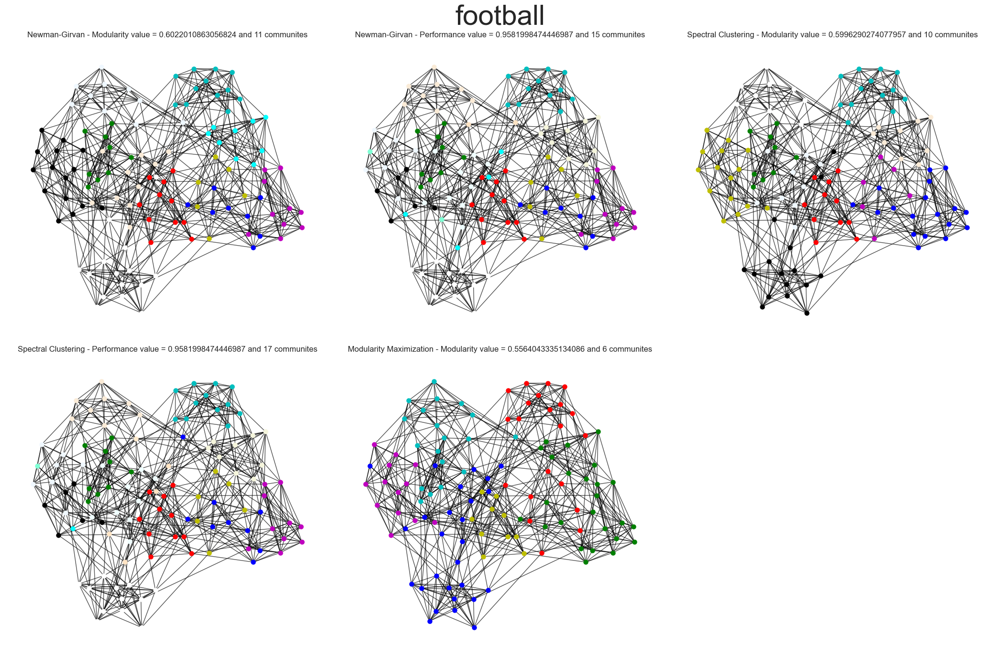

In [395]:
show_graph_communities(football, "football", colors)

Γνωρίζουμε οτι οι πραγματικές κοινότητες είναι 12. Σε αυτον τον αριθμό μονο προσεγγιστικά βλέπουμε ότι οι Newman-Girvan και Spectral-Clustering με την μετρική modularity προσεγγίζουν τον αριθμό των κοινοτήτων. Γενικά οι αλγόριθμοι παραγουν ευδιάκριτες κοινότητες, με χειροτερη την περίπτωση του Spectral-Clustering με την μετρική performance. 

#### Οπτικοποίηση κοινοτήτων Game of Thrones

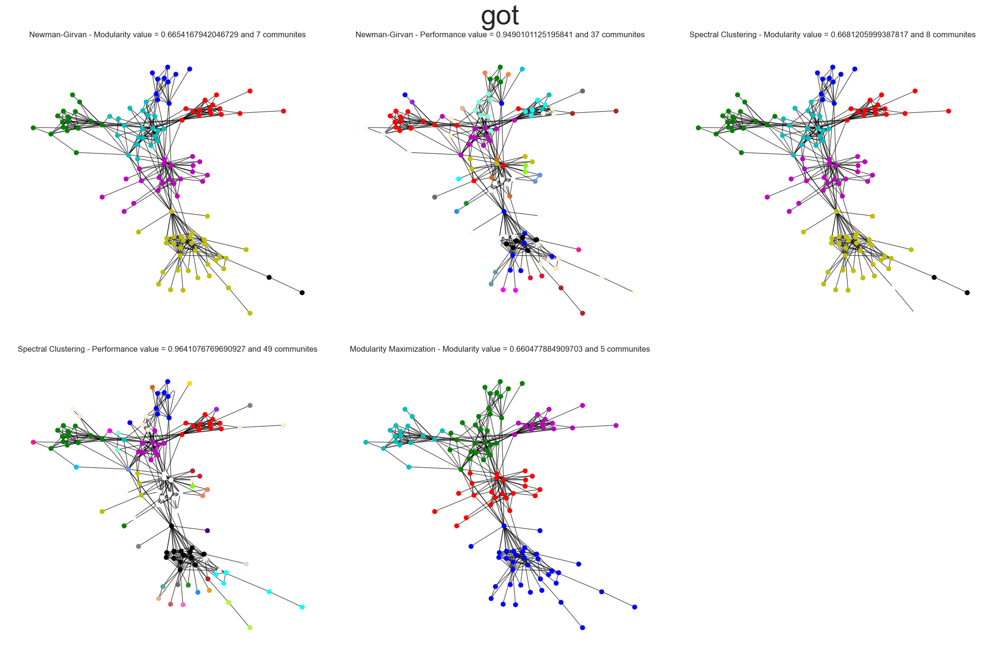

In [396]:
show_graph_communities(got, "got", colors)

Για τομ γράφο αυτον γνωρίζουμε οτι οι κοινότητες είναι 6, κατι που καμια περιπτωση αλγορίθμου δεν βρίσκει, αλλα απλά προσεγγιζει. Οι αλγοριθμοι με πιο κοντινές τιμές κοινοτητων ειναι όσοι χρησιμοποιούν την μετρική modularity. Αυτο ειναι λογικο αφου οι κοινοτητες ειναι πιο διακριτες και ευκολοτερο να εντοπιστουν αφού ειναι λιγότερες σε σχέση με τις υπερβολικά περισσότερες που προκύπτουν απο το performance. 

#### Οπτικοποίηση κοινοτήτων email-Eu-core (να οπτικοποιηθεί και η ground-truth διαμέριση)

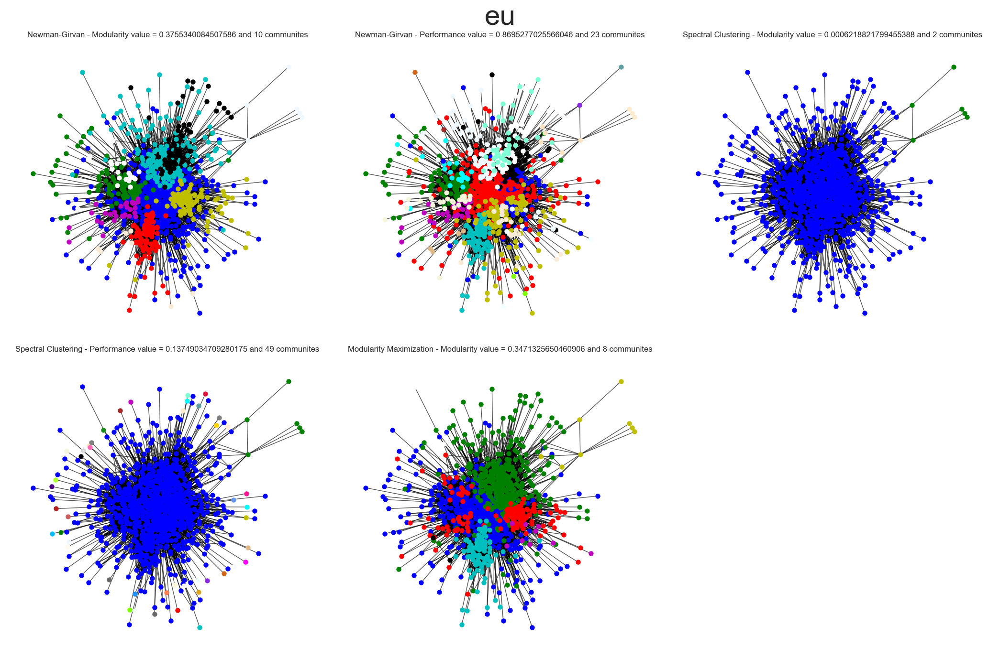

In [397]:
show_graph_communities(eu_subgraph, "eu", colors)

Ground Truth διαμέριση του email-Eu-core


Modularity Score of Ground Truth partition: 0.28801318862374214
Performance Score of Ground Truth partition: 0.9428136036490563


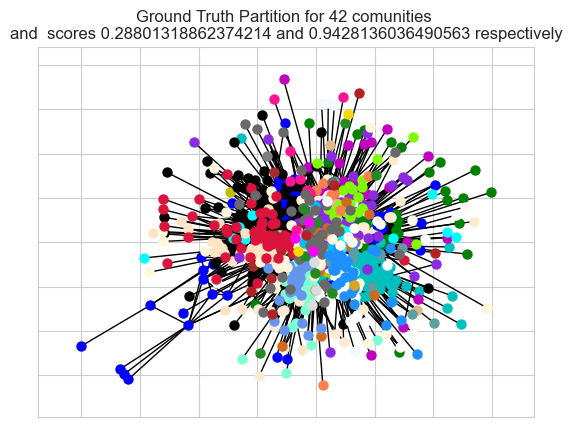

In [414]:
file_path = "/home/opc/sna2/email-Eu-core-department-labels.txt"
def create_communities_from_file(file_path, graph):
    comms = {}
    with open(file_path) as file:
        for line in file:
            node, comm = line.split()
            if node in graph:
                comms.setdefault(comm, []).append(node)
    return comms

def visualize_graph_with_communities(graph, communities, title):
    plt.title(title)
    pos = nx.fruchterman_reingold_layout(graph)
    nx.draw_networkx_edges(graph, pos=pos)

    for nodes, color in zip(communities, colors):
        nx.draw_networkx_nodes(graph, pos=pos, node_size=42, nodelist=nodes, node_color=color)

    plt.show()

# Create communities from the file
communities = create_communities_from_file(file_path, eu_subgraph).values()

ground_truth_mod = nx.algorithms.community.quality.modularity(eu_subgraph, communities)
ground_truth_perf = nx.algorithms.community.quality.partition_quality(eu_subgraph, communities)[1]

print("Modularity Score of Ground Truth partition:", ground_truth_mod)
print("Performance Score of Ground Truth partition:", ground_truth_perf)
title = "Ground Truth Partition for " + str(len(communities)) + " comunities \nand  scores " + str(ground_truth_mod) + " and " + str(ground_truth_perf) + " respectively"
# Visualize the graph with communities
visualize_graph_with_communities(eu_subgraph, communities, title)


Από την ground-truth διαμέριση φαίνεται ότι οι κοινότητες είναι πιο διακριτές. Ο αριθμός 42 θα πρεπει να μας προβληματίζει οσον αφορά τις λοιπές μετρικες, αφου καμια δεν εντοπιζει καλα τις κοινοητες, εκτός της Spectral-Clustering με το Performance metric που το προσεγγιζει. Αξιο να σημειωθεί ειναι οτι παρουσιάζεται αρκετά μεγάλη διαφορά στο performance score αναμεσα στο ground truth και τις άλλες διαμερίσεις. 

#### Οπτικοποίηση κοινοτήτων REG

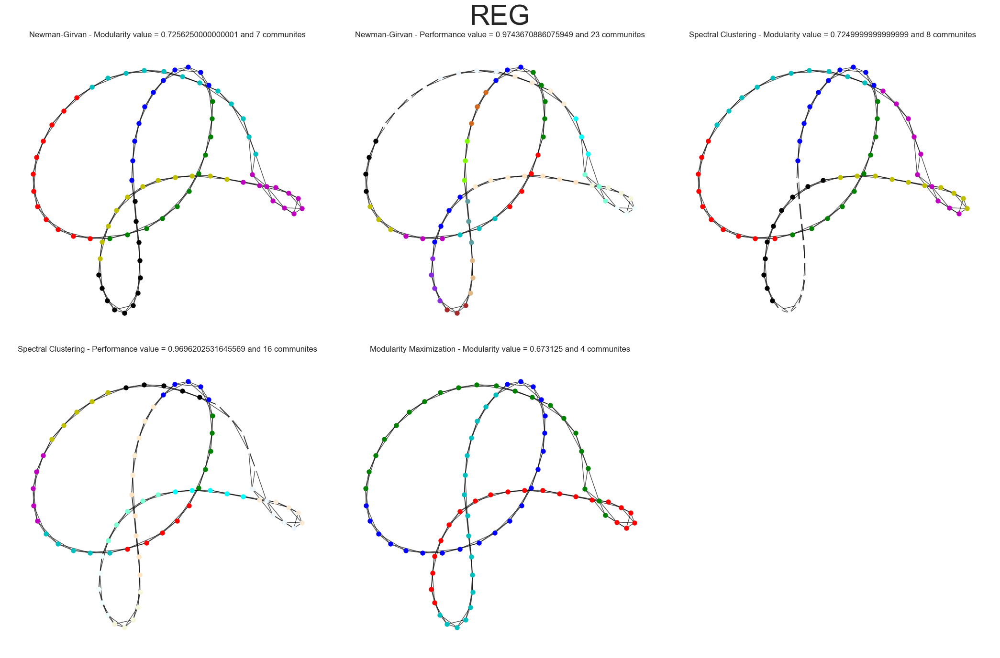

In [398]:
show_graph_communities(REG, "REG", colors)

Δεν υπάρχει τρόπος εντοπισμού των κοινοτητων, καθε φορα επιλέγονται τυχαία, αφου ο βαθμος ειναι ιδιος. Παρόλα αυτα φαίνεται η διαδοχικότητα στις κοινότητες που προκύπτει απο τα υψηλά scores στις μετρικές modularity και performance.

#### Οπτικοποίηση κοινοτήτων RGER

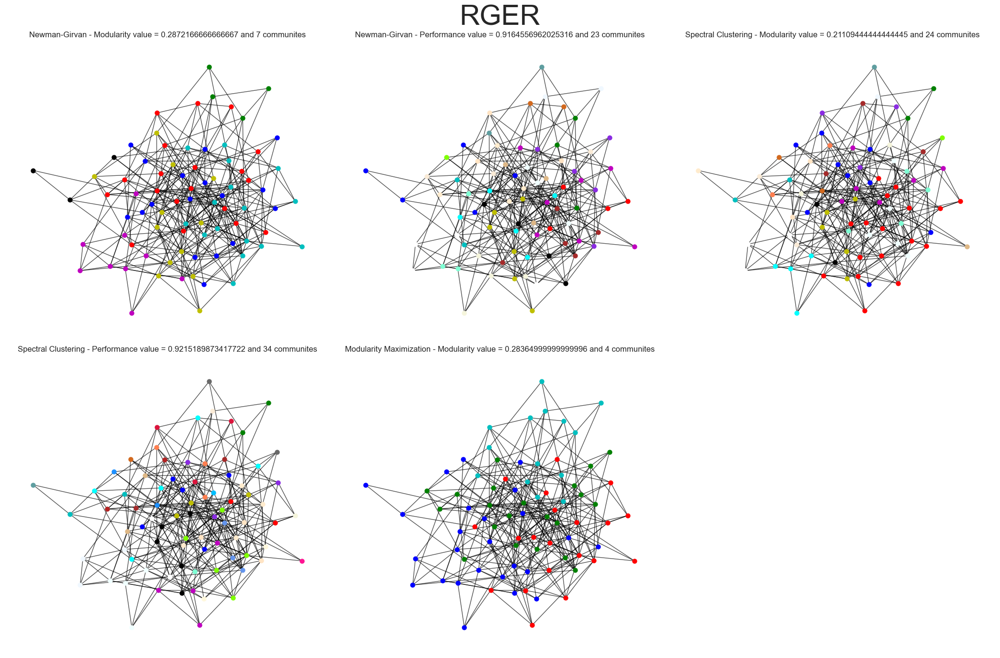

In [399]:
show_graph_communities(RGER, "RGER", colors)

Όπως και πριν υπάρχει τυχαιότητα στον σχηματισμό κοινοτήτων, και μεσω καμιας μετρικης η αλγορίθμου δεν εχουμε αρκετα διακριτες και καλα οπτκοποιημένες κοινότητες. 

#### Οπτικοποίηση κοινοτήτων RGG

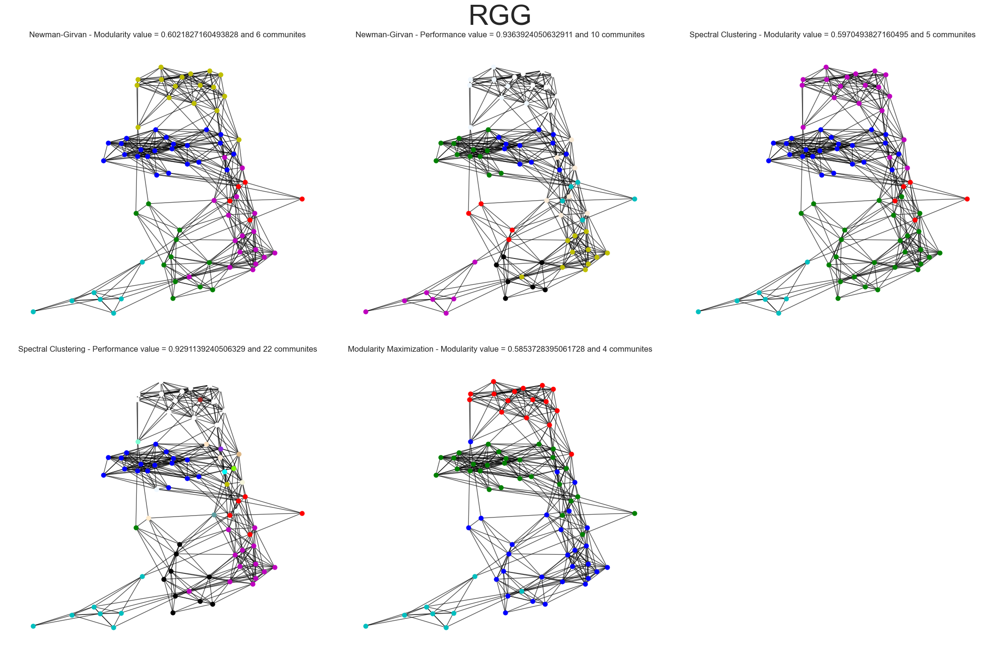

In [400]:
show_graph_communities(RGG, "RGG", colors)

 Οι κοινότητες στην περιπτωση του RGG αναμένεται να είναι γύρω από τους κόμβους με μεγαλύτερο degree καθως εδω οι κομβοι ειναι συνδεδεμένοι με τους γυρω τους. Αυτό φαίνεται και από τα αποτελέσματα των μετρικών modularity και performance. Επίσης, οι κοινότητες είναι πιο διακριτές. 

#### Οπτικοποίηση κοινοτήτων SW

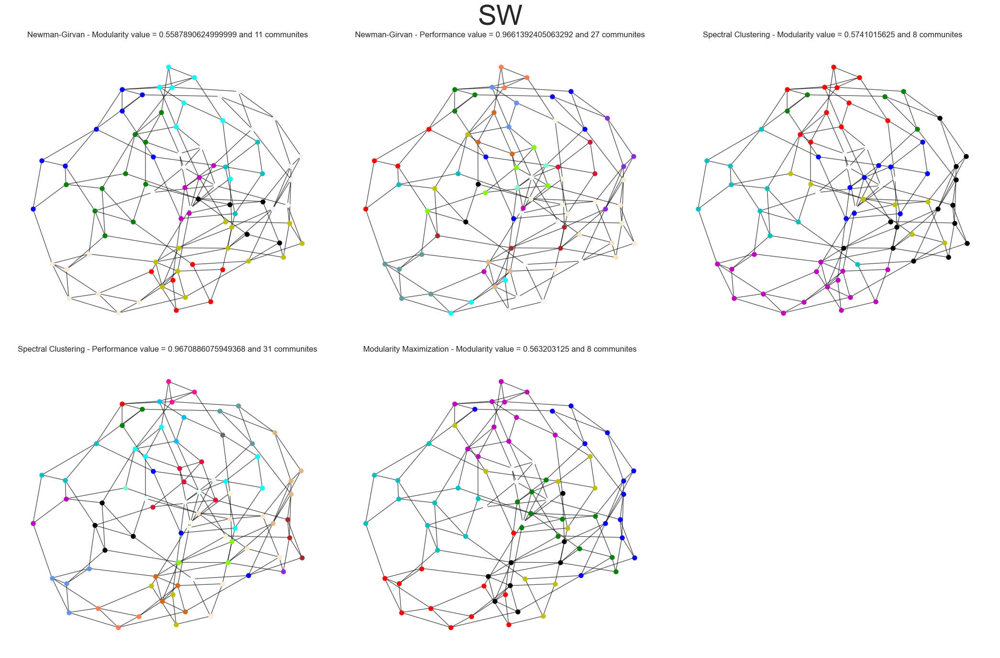

In [401]:
show_graph_communities(SW, "SW", colors)

Στην τοπολογία Small World αναμένουμε κοινότητες γύρω απο nodes με μεγάλο degree. Φαίνεται από τους αλγόριθμους με καλύτερο modularity. 

#### Οπτικοποίηση κοινοτήτων SF

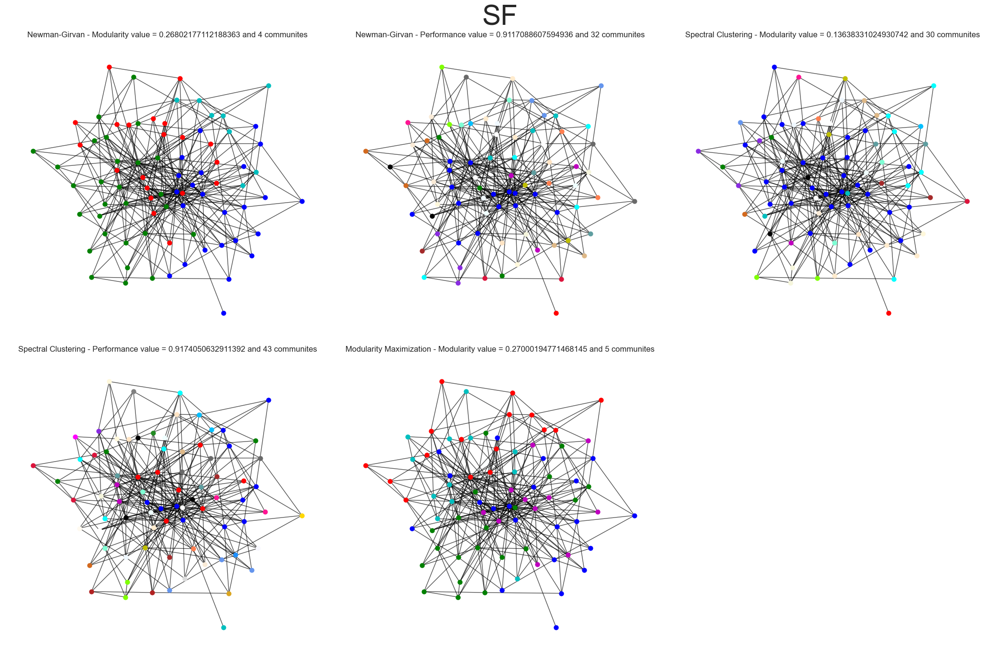

In [402]:
show_graph_communities(SF, "SF", colors)

Αναμένονται αποτελέσματα αντίστοιχα του SW, αφού και εδώ έχουμε κοινότητες γύρω από nodes με μεγάλο degree. Ωστόσο καλύτερα αποτελέσματα πάλι είναι εμφανη στην μετρική modularity. 